# Углубленная задача Object Detection: 

---

#### План:
1. Компоненты современных алгоритмов, предназначенных для задачи Object Detection
2. Faster-R-CNN. Архитектура, логика работы и обучение.
3. YOLO. Подход и архитектура, логика работы и обучение.


 

### Компоненты современных алгоритмов для задачи Object Detection:

---

В современных подходах к решению задачи детекции объектов, реализованы пару новых "фишек", которые помогают нам работать с задачей детекции наиболее эффективно, при этом не сжирая ресурсы нашего устройста и давая возможность работать в реальном времени. Что это за компоненты:

1. Якорные рамки или фиксированные рамки. **Anchor Boxes**
2. RPN - **Region Proposal Network.**
3. Region of interest pooling **(RoIP)**

Пойдем и разберемся с каждым из понятий более подробно.

<br>
</br>


---

#### Anchor Boxes (Якорные рамки):

<br>
</br>

![](./../src/imgs/anchor_boxes_.png)


----

<br>
</br>

* **_Зачем вообще мы приходим к концепции якорных рамок и что это такое?_**

Представьте что у нас довольно большое изображение, на котором изображенно огромное количество различных объектов отличающихся как по цвету, по размеру, по длине и ширине и прочим характеристикам. Наша задача - научить алгоритм как бы "видеть" и распознавать все эти объекты, как это делаем мы, используя все те характеристики. То есть когда мы первый раз смотрим на какой-то участок изображения по росту и ширине объекта мы понимаем уже паттерн человека, по продолжительности длины ограниченных с двух сторон линий и разметке мы понимаем что скорее всего это дорога и так далее.

Соответственно, определить все это нам могут помочь так называемые якорные рамки. Они помогают нам заранее определить, какой формы и размера могут быть объекты на нашем изображении. Мы как бы "автоматически" указываем системе, что объекты могут быть такими какими мы указываем. 

<br>
</br>

* **_Как формируются якорные рамки?_**

Самый простой метод - это мы создаем набор стандартных рамок различных размеров и пропорций. Это могут быть как длинные так и узкие прямоугольники (например для распознования автобусов) или более квадратные и пропорциональные (например для обнаружения дорожных знаков или лиц). Затем мы накладываем сетку на все наше изображение и на каждой "ячейки" полученной сетки размещаем наши сформированные кастомные якорные рамки. 

<br>
</br>

* **_Ну и что теперь?_**

Теперь, когда у нас есть сформированные регионы при помощи якорных рамок, наш алгоритм "начинает смотреть" на каждую такую ячейку (он же регион) при помощи наших якорных рамок (которые по сути играют некую роль фильтра) и пытается понять "а нет ли у меня тут знакомых паттернов, которые мне задали" или которые я определил (да этот процесс тоже можно автоматизировать, например через сегментацию K-Means). Если мы находим подходящий объект - отлично мы справились, отмечаем его и адаптируем размер якорной рамки так, чтобы объект влез в нее как можно плотнее (лучше).

<br>
</br>

* **_Влияние разныех объектов в одной ячейке_**

Здесь и раскрывается вся "прелесть" якорных рамок. Благодаря различным размерам и формам рамок, мы можем обнаруживать несколько объектов даже в одной ячейке, выбрав для каждого наиболее подходящую рамку. То есть даже если у нас в одном "поле" сетки окажутся машина и пешеход, мы все равно сможем без проблем их различить, потому что у нас разные "карты" (рамки) для детекции различных объектов. 

Благодаря таким якорным рамкам мы можем видеть объекты разных размеров и форм и решать задачу обнаржуения объектов уже более эффективно чем делали это до.

<br>
</br>

![](https://nrsyed.com/img/yolov3_postprocess.gif)

<br>
</br>


---

#### RPN - Regional Proposal Network. Используем наши якорные рамки по умному:

<br>
</br>

![](./../src/imgs/RPN_for_anchors.png)


----

<br>
</br>

В RPN мы используем наши якорные рамки для прогнозирования областей, в которых с большой вероятностью может находиться объект. 

<br>
</br>

### **Немного подробнее сначала простым языком:**

Представим что на нашем изображении находится пейзаж поля с различными цветами. Наша задача - найти самые необычные экземпляры. RPN - это по сути автоматизированный помощник, который сканирует наше изображение и отмечает только и только потенциально интересные участки нашего изображения, где возможно присутствуют какие-то уникальные объекты. 

Как это работает вместе с якорными рамками, которые мы получили на предыдущем шаге. RPN берет якорные рамки и начинает их "примеривать" к разным участкам нашего изображения (пейзажа), пытаясь понять, где что находится. RPN не просто сканирует изображение и наугад выбирает участки, а анализирует всю картину целиком, понимая, где больше всего шансов найти искомый или искомые объекты. То есть, он смотрит вдобавок на такие признаки как - текстуры, цвета и прочие признаки, чтобы скорректировать и повысить точность своих предложений. 

Таким образом несмотря на всю быстроту работы, RPN помогает нам сфокусировать на наиболее перспективных областях, экономя время и ресурсы. 

Как построен процесс работы сети - первым делом сеть сканирует все изображение с использованием якорных рамок различных размеров и пропорций, чтобы выделить потенциальные области, где могут находиться объекты. Сеть как бы накладывает рамки на каждый участок изображения и анализирует, подходит ли что-то под эти рамки или нет. 

Для каждой якорной рамки RPN оценивает 2 вещик:
1. Вероятность того, что в рамке есть объект (и не важно какой просто есть или нет).
2. Как необходимо модифицировать рамку, чтобы она лучше соответствовала объекту (если он там есть).

После того, как при помощи сети мы сформировали region proposals, мы передаем эти области дальше уже в другую нейронную сеть (сверточную) для того чтобы сформировать активационные карты и решить задачу классификации и локализации наших объектов. 


<br>
</br>

### **Немного подробнее сначала уже с точки зрения технической составляющей:**


<br>
</br>

Снова на примере, так как таким образом легче понять логику работы. Предположим, что у нас есть картинка размерностью **224х224х3**. Допустим, что у нас существует **якорная рамка с размерностью 8х8**. Если принять за условие, что **размерность нашего страйда равна 8 пикселям (шаг страйда)**, то мы получим **224/8 = 28** фреймов (кусочков) для каждой строки изображения, по сути **28х28 = 576** фреймов мы получим из нашего изображения. Затем мы берем каждый полученный кусочек из этих сформированных фреймов и передаем это все в Region Proposal Network (RPN), которая показывает в свою очередь используя различные паттерны, создержит ли данный фрейм искомый объект или нет (отбрасывая, не передавая дальше те где нет нашего паттерна). По сути RPN определяет **вероятность того, что в нашем фрейме содержиться искомый объект**.

Благодаря этому мы избавляемся от слишком затратного подхода, основанным на подходе через Selective Search. 

<br>
</br>

В нашем тренировочном датасете теперь есть доступ к ground truth объектам. Теперь мы можем забрать каждый region proposal сформированный через RPN и сравнить ground truth bounding box объекта с нашим фреймов и посчитать IoU между кандидатом и реальной рамкой. Если метрика IoU выше чем выставленное пороговое значение (например 0.5) то сформированный регион содержит искомый объект, если меньше определенного порога (0.1) регион не содержит искомый объект и то что между у нас игнорируется в процессе расчетов, как область неопределенности. 

<br>
</br>

Теперь когда мы приступаем к тренировке модели для того чтобы обучить ее предсказывать регионы для наших кандидатов где возможно содержиться искомый объект, мы запускаем процесс Non-Max Supression (так как несколько регионов могут например перекрываться). 

Итого весь процесс можно выразить и описать при помощи следующих шагов:
1. Передвигаем якорные рамки с различным масштабом по нашему изображения для получения различных участков (фреймов).
2. Вычисляем IoU между истинными границами объектов на изображении и фреймами которые мы получили на предыдущем шаге.
3. Подготавливаем обучающий набор данных таким образом, чтобы фреймы которые имеют метрику IoU больше порогового значения содержали объект, а фреймы с меньшим показателем метрики не содержали объекта (делим выборку на позитивную и негативную).
4. Тренируем модель на задачу определения регионов, которые с большей вероятностью содержат объект.
5. Накладываем Non Max Suppression для того, чтобы идентифицировать регионы где у нас высокая вероятность встретить искомый объект и избавить от других регионов, которые не несут никакой полезной информации об искомом объекте.

<br>
</br>

### **Классификация и регрессия в данном подходе:**

<br>
</br>

В таком подходе у нас наблюдается небольшая проблема связанная с финальным выходом из модели, кто додумался какая?

<br>
</br>

Мы с вам уже знаем, что необходимо реализовать следующие шаги, чтобы идентифицировать объекты и найти координаты для ограничительной рамки:
1. Идентифицировать объект при помощи классификации
2. Убедиться что все карты признаков наших регионов, вне знависимости от формы региона, такие же как и в нашем выходе после RoI пуллинга. 

<br>
</br>

Но тут возникает проблемака в нашем новом подходе:
1. Region Proposal'ы не соответствуют в точности нашему объекту на изображении.
2. Мы смогли идентифицировать регион как содержащий объект или нет, но не саму метку класса внутри регионаю. 

<br>
</br>

Как же нам найти и класс и координаты для идентифицированного объекта...

<br>
</br>

![](./../src/imgs/coords_identification_rpn.png)

<br>
</br>

Один из способов - взять полученную карту активаций (признаков) одинаковой (равномерной) формы и пропустить ее через сеть которая представлена выше, тем самым мы ожидаем, что сеть предскажит класс объекта, содержащегося в предполагаемой области, а также все смещения, которые соответствуют данной области, чтобы обеспечить как можно более плотное прилегание ограничительной рамки к объекту на изображении.

<br>
</br>

Как это работает на примере архитектуры выше: мы получаем выход из RoI пуллинг слоя и берем его в качеств входа (на примере размерность **7х7х512**) в FC слой и соединяем его с Dense Layer (вторым FC слоем) прежде чем заняться предсказанием:

* Класса объекта полученного в регионе
* Величины смещения прогнозируемых границ для ограничительной рамки путем максимизации метрики IoU по отношению к истинному изображению 

 То есть когда мы разворачиваем весь полученный тензор в вектор, у нас уже имеются потенциальные рамки (мы оптимизируемся по IoU) и также этот вектор можем прогнать через софтмакс для получения класса. Итого например если в нашем датасете 20 классов, то выход из такой нейронной сети будет содеражить 25 потенциальных значений (21 класс плюс метка для бэкгрануда и 4 координаты для высоты, ширины и 2 координаты центра ограничительной рамки). 
 
<br>
</br>

Таким обрзом весь пайплайн складывается в следующую архитектуру:

<br>
</br>

![](./../src/imgs/rpn_arch_pipeline.png)


<br>
</br>

Теперь рассмотрим на примере кода как это все работает

In [19]:
import os 
from pathlib import Path
from torch_snippets import *
import cv2
import torch
from torch.utils.data import DataLoader, Dataset, TensorDataset
from PIL import Image
import glob
import pandas as pd

import warnings
warnings.filterwarnings("ignore")

In [16]:
# CONSTS
IMAGE_ROOT = './data/open-images-bus-trucks/images'
DF_RAW = pd.read_csv('./data/open-images-bus-trucks/df.csv')
device = "cuda" if torch.cuda.is_available() else "cpu"

In [12]:
DF_RAW.head().columns

Index(['ImageID', 'Source', 'LabelName', 'Confidence', 'XMin', 'XMax', 'YMin',
       'YMax', 'IsOccluded', 'IsTruncated', 'IsGroupOf', 'IsDepiction',
       'IsInside', 'XClick1X', 'XClick2X', 'XClick3X', 'XClick4X', 'XClick1Y',
       'XClick2Y', 'XClick3Y', 'XClick4Y'],
      dtype='object')

In [13]:
# Define the indices corresponding to labels and targets
label2target = {label: t+1 for t, label in enumerate(DF_RAW['LabelName'].unique())}
label2target['background'] = 0

# The same but for target2label process
target2label = {target: label for label, target in label2target.items()}
backgound_class = label2target['background']

# And calculate the number of classes
num_classes = len(label2target)

In [15]:
print(f"Label to target: {label2target}\nTarget to label: {target2label}\nNumber of classes: {num_classes}")

Label to target: {'Bus': 1, 'Truck': 2, 'background': 0}
Target to label: {1: 'Bus', 2: 'Truck', 0: 'background'}
Number of classes: 3

In [17]:
# Basic image preprocessing 
def preprocess_image(img):
    img = torch.tensor(img).permute(2, 0, 1)
    return img.to(device).float()

In [20]:
# Define the dataset class that we are going to use during the training 
class OpenDataset(Dataset):
    w, h = 224, 224
    def __init__(self, df, image_dir=IMAGE_ROOT):
        self.image_dir = image_dir
        self.df = df
        self.files = glob.glob(self.image_dir + '/*')
        self.image_infos = df.ImageID.unique()
    
    # __getitem__ dunder method that returns the preprocessed image and the target values
    def __getitem__(self, ix):
        # load images and masks
        image_id = self.image_infos[ix]
        img_path = find(image_id, self.files)
        img = Image.open(img_path).convert("RGB")
        img = np.array(img.resize((self.w, self.h), resample = Image.BILINEAR)) / 255.
        data = self.df[self.df['ImageID'] == image_id]
        labels = data['LabelName'].values.tolist()
        data = data[['XMin','YMin','XMax','YMax']].values
        
        # Convert to absolute coordinates
        data[:,[0,2]] *= self.w
        data[:,[1,3]] *= self.h 
        boxes = data.astype(np.uint32).tolist() 
        
        # torch FRCNN expects ground truths as a dictionary of tensors
        target = {}
        target["boxes"] = torch.Tensor(boxes).float()
        target["labels"] = torch.Tensor([label2target[i] for i in labels]).long()
        img = preprocess_image(img)
        return img, target
    
    def collate_fn(self, batch):
        return tuple(zip(*batch))
    
    def __len__(self):
        return len(self.image_infos)

In [22]:
# Create the training and validation dataloaders and datasets
from sklearn.model_selection import train_test_split

train_ids, val_ids = train_test_split(DF_RAW.ImageID.unique(), test_size = 0.2)

train_df, val_df = DF_RAW[DF_RAW['ImageID'].isin(train_ids)], DF_RAW[DF_RAW['ImageID'].isin(val_ids)]

train_ds = OpenDataset(train_df)
test_ds = OpenDataset(val_df)

# Dataloaders
train_loader = DataLoader(train_ds, batch_size = 15, collate_fn = train_ds.collate_fn, drop_last = True)
test_loader = DataLoader(test_ds, batch_size = 15, collate_fn = test_ds.collate_fn, drop_last = True)

In [ ]:
# Define the model architecture
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

def get_model():
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
    return model

In [24]:
from torch.optim import optimizer
# Defining training and validation functions for a single batch
def train_batch(inputs, model, optimizer):
    model.train()
    input, targets = inputs
    input = list(image.to(device) for image in input)
    targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
    optimizer.zero_grad()
    losses = model(input, targets)
    loss = sum(loss for loss in losses.values())
    loss.backward()
    optimizer.step()
    return loss, losses

@torch.no_grad() # this will disable gradient computation in the function below
def validate_batch(inputs, model):
    model.train() # to obtain the losses, model needs to be in train mode only. # #Note that here we are not defining the model's forward method 
#and hence need to work per the way the model class is defined
    input, targets = inputs
    input = list(image.to(device) for image in input)
    targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

    optimizer.zero_grad()
    losses = model(input, targets)
    loss = sum(loss for loss in losses.values())
    return loss, losses

In [25]:
model = get_model().to(device)
optimizer = torch.optim.SGD(model.parameters(), lr=0.005,
                            momentum=0.9, weight_decay=0.0005)
n_epochs = 5
log = Report(n_epochs)

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to C:\Users\murmo/.cache\torch\hub\checkpoints\fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:08<00:00, 20.9MB/s] 


In [46]:
model

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [26]:
for epoch in range(n_epochs):
    _n = len(train_loader)
    for ix, inputs in enumerate(train_loader):
        loss, losses = train_batch(inputs, model, optimizer)
        loc_loss, regr_loss, loss_objectness, loss_rpn_box_reg = \
            [losses[k] for k in ['loss_classifier','loss_box_reg','loss_objectness','loss_rpn_box_reg']]
        pos = (epoch + (ix+1)/_n)
        log.record(pos, trn_loss=loss.item(), trn_loc_loss=loc_loss.item(), 
                   trn_regr_loss=regr_loss.item(), trn_objectness_loss=loss_objectness.item(),
                   trn_rpn_box_reg_loss=loss_rpn_box_reg.item(), end='\r')

    _n = len(test_loader)
    for ix,inputs in enumerate(test_loader):
        loss, losses = validate_batch(inputs, model)
        loc_loss, regr_loss, loss_objectness, loss_rpn_box_reg = \
          [losses[k] for k in ['loss_classifier','loss_box_reg','loss_objectness','loss_rpn_box_reg']]
        pos = (epoch + (ix+1)/_n)
        log.record(pos, val_loss=loss.item(), val_loc_loss=loc_loss.item(), 
                  val_regr_loss=regr_loss.item(), val_objectness_loss=loss_objectness.item(),
                  val_rpn_box_reg_loss=loss_rpn_box_reg.item(), end='\r')
    if (epoch+1)%(n_epochs//5)==0: log.report_avgs(epoch+1)

EPOCH: 0.773  trn_loss: 0.119  trn_loc_loss: 0.057  trn_regr_loss: 0.050  trn_objectness_loss: 0.008  trn_rpn_box_reg_loss: 0.004  (5279.80s - 28853.91s remaining)

KeyboardInterrupt: 

  0%|          | 0/106 [00:00<?, ?it/s]


AttributeError: 'Report' object has no attribute 'val_loss'

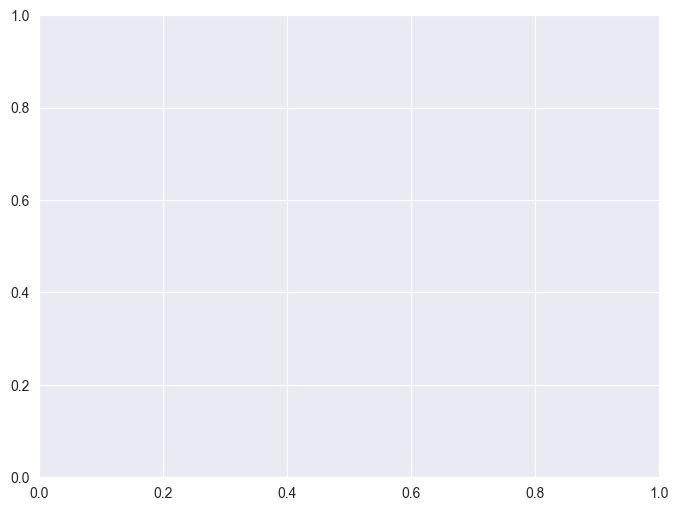

In [27]:
log.plot_epochs(['trn_loss','val_loss'])

In [29]:
from torchvision.ops import nms
def decode_output(output):
    'convert tensors to numpy arrays'
    bbs = output['boxes'].cpu().detach().numpy().astype(np.uint16)
    labels = np.array([target2label[i] for i in output['labels'].cpu().detach().numpy()])
    confs = output['scores'].cpu().detach().numpy()
    ixs = nms(torch.tensor(bbs.astype(np.float32)), torch.tensor(confs), 0.05)
    bbs, confs, labels = [tensor[ixs] for tensor in [bbs, confs, labels]]

    if len(ixs) == 1:
        bbs, confs, labels = [np.array([tensor]) for tensor in [bbs, confs, labels]]
    return bbs.tolist(), confs.tolist(), labels.tolist()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


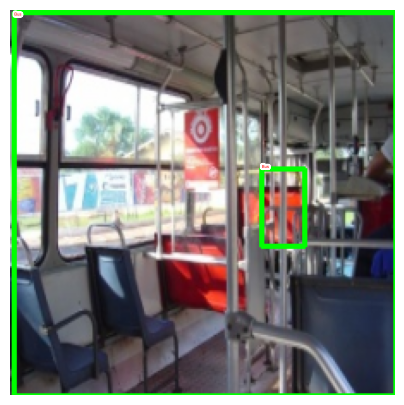

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


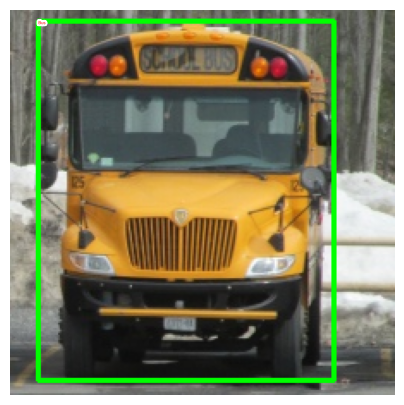

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


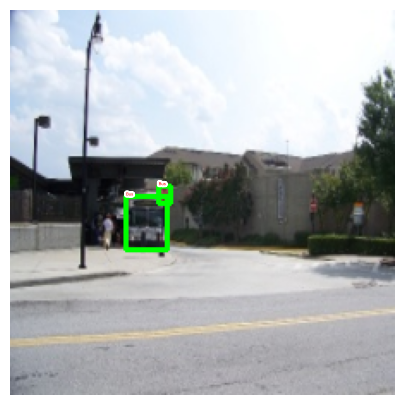

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


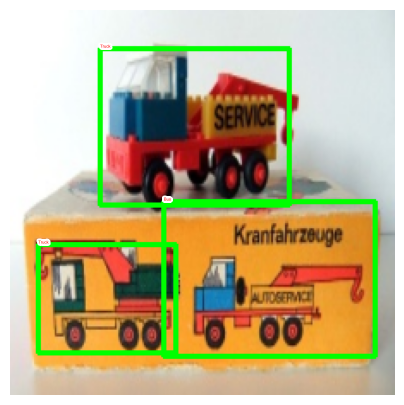

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


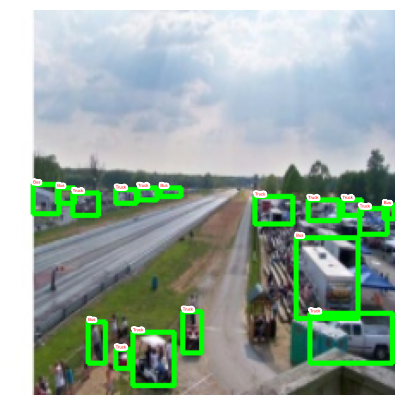

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


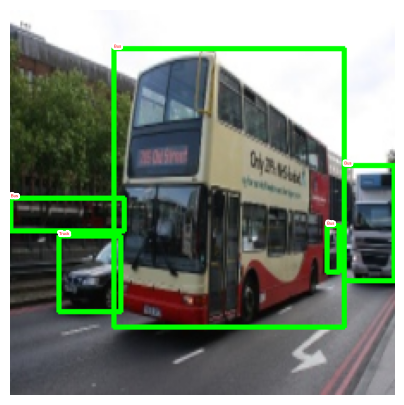

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


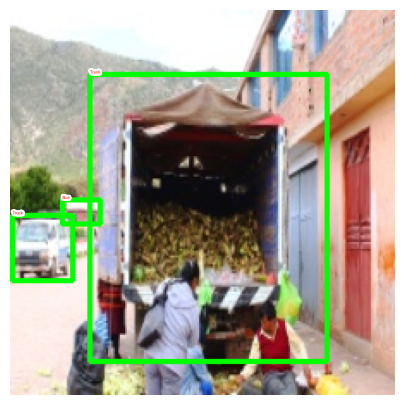

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


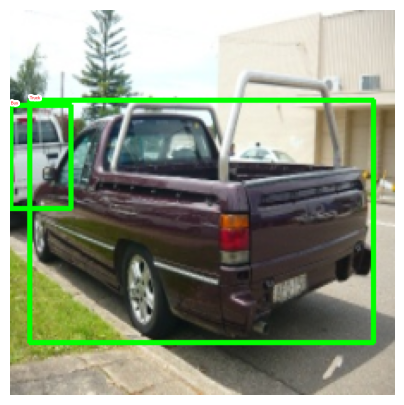

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


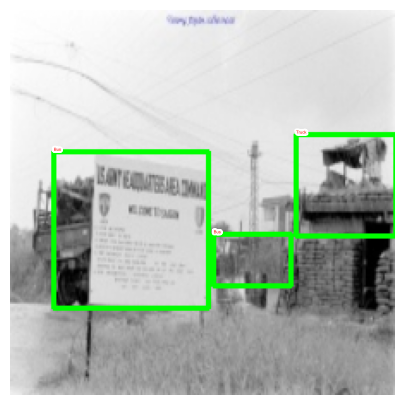

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


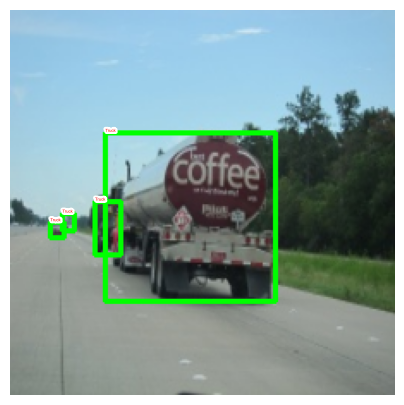

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


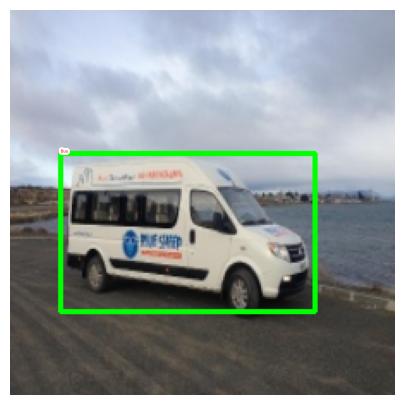

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


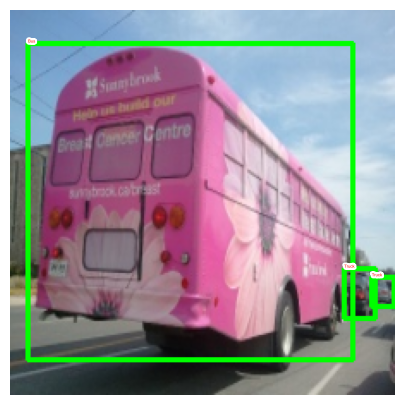

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


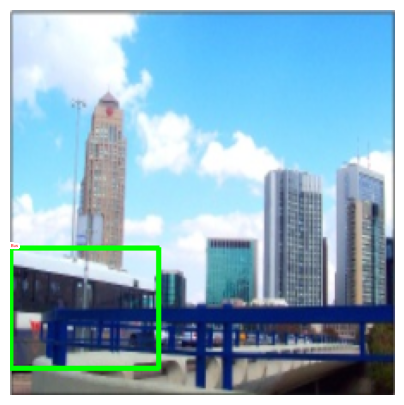

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


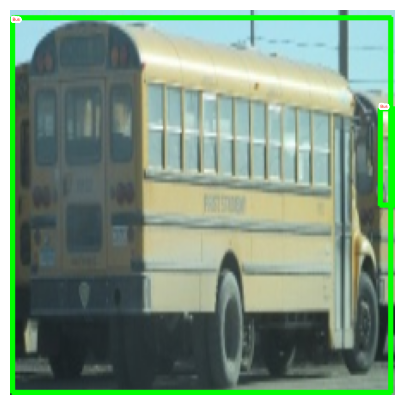

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


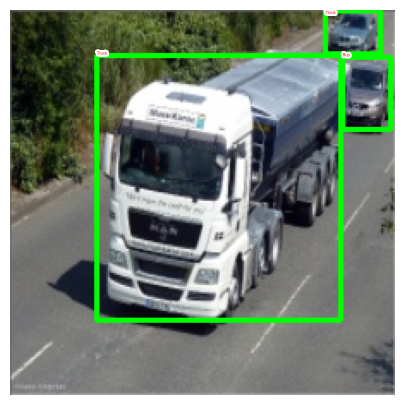

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


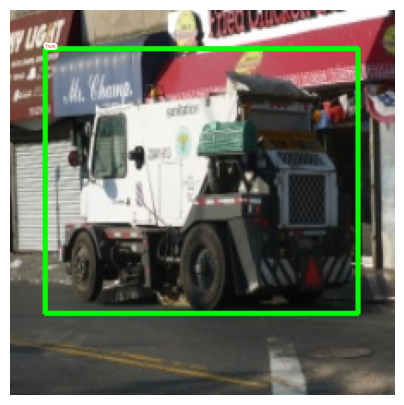

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


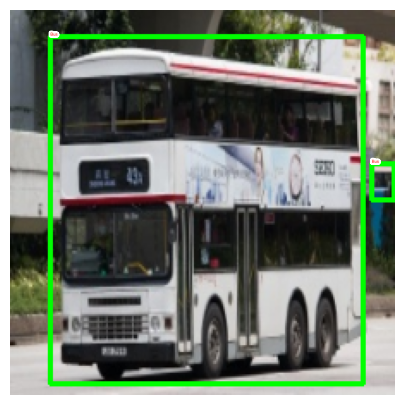

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


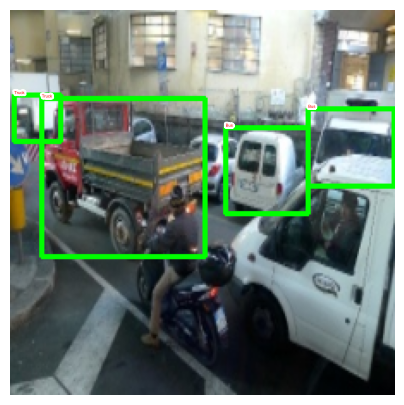

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


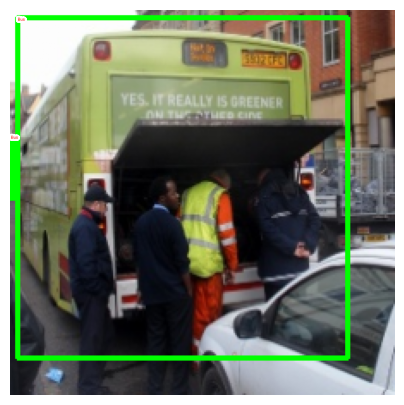

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


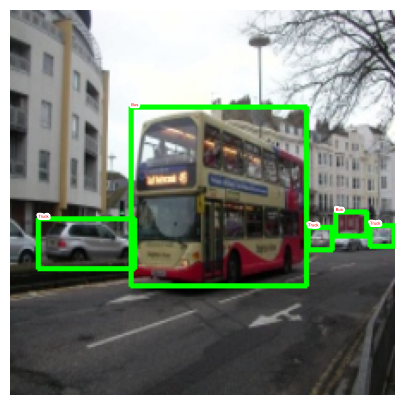

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


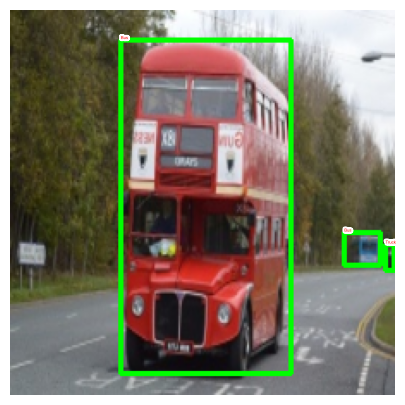

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


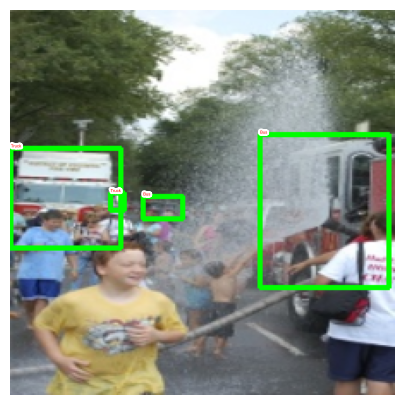

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


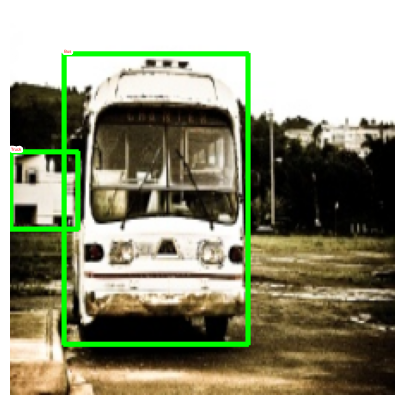

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


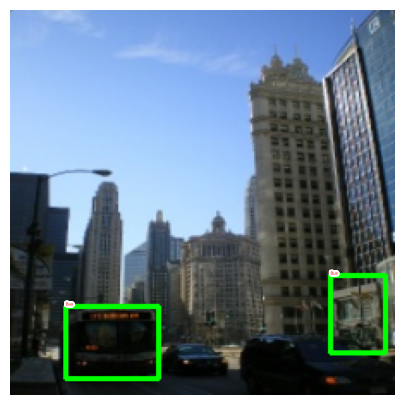

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


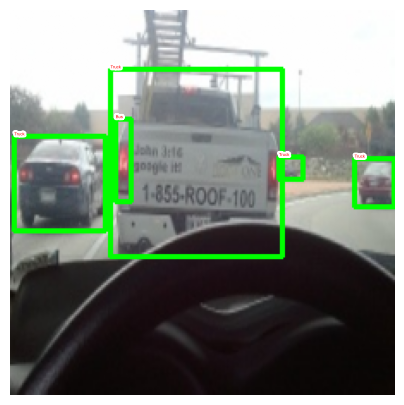

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


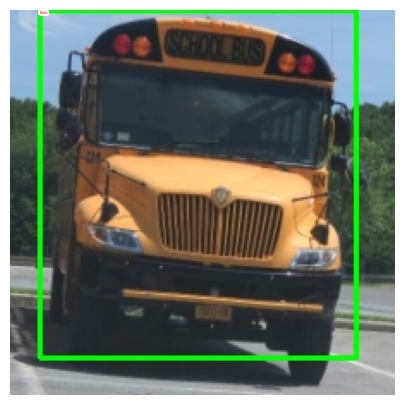

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


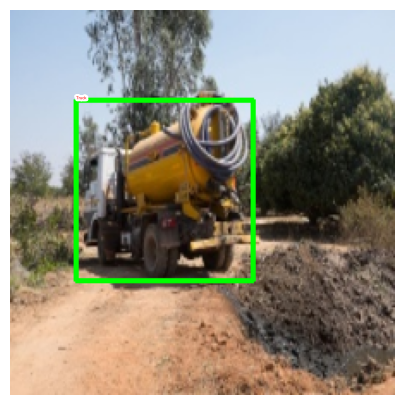

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


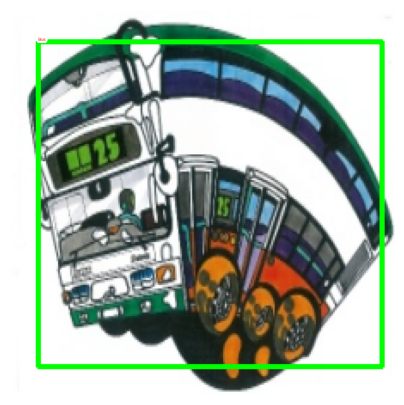

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


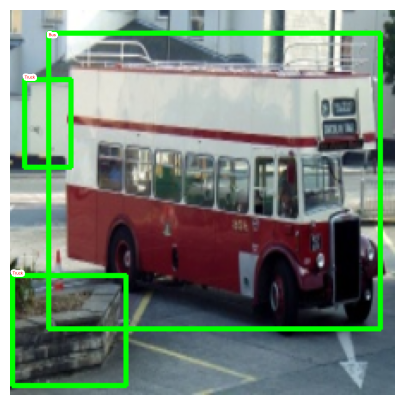

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


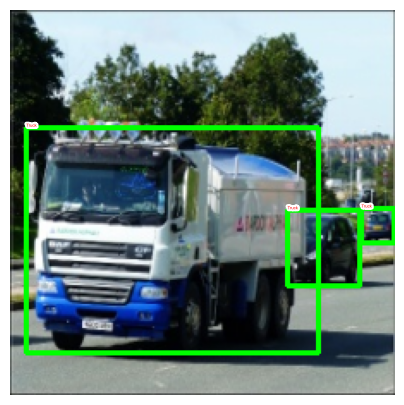

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


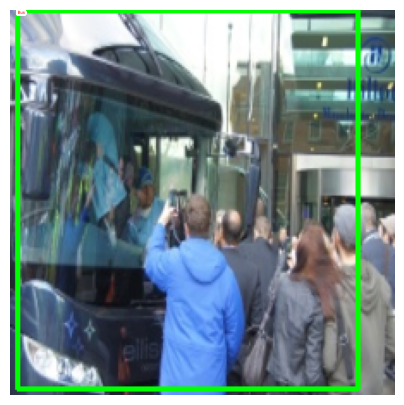

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


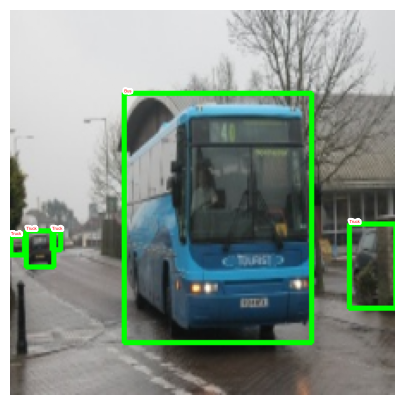

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


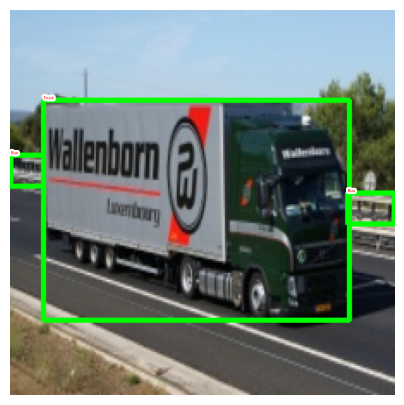

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


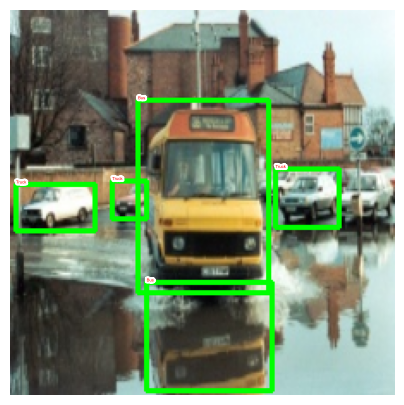

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


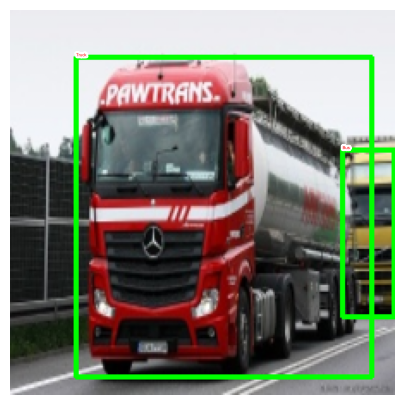

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


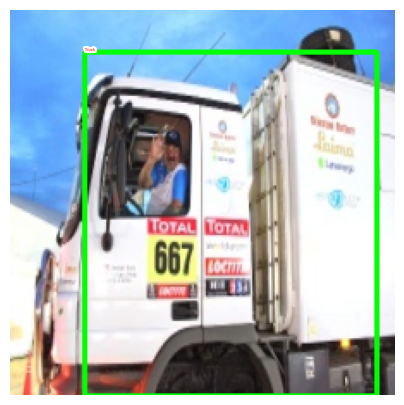

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


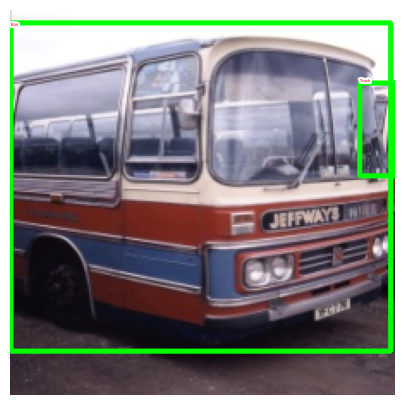

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


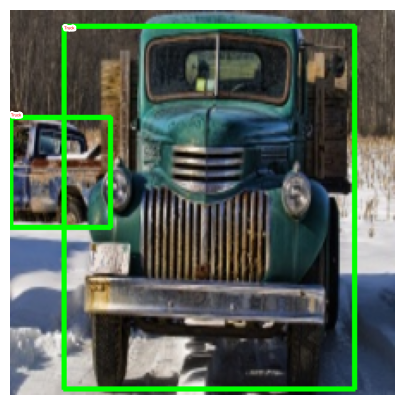

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


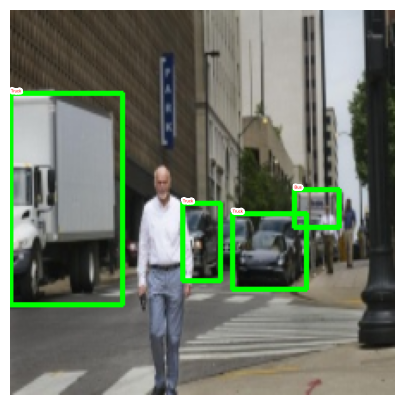

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


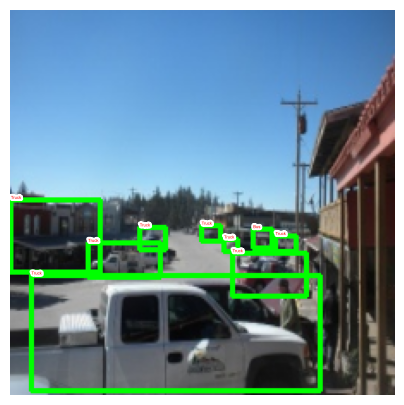

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


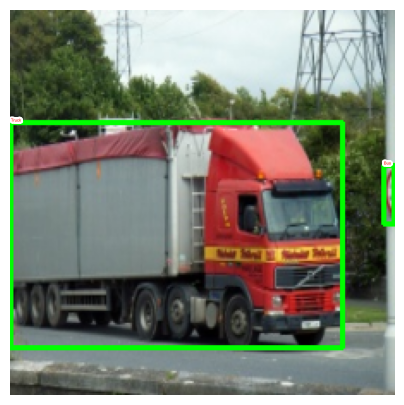

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


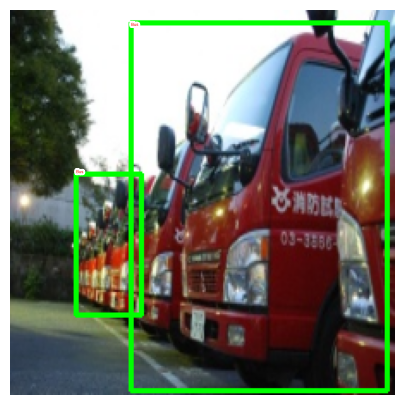

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


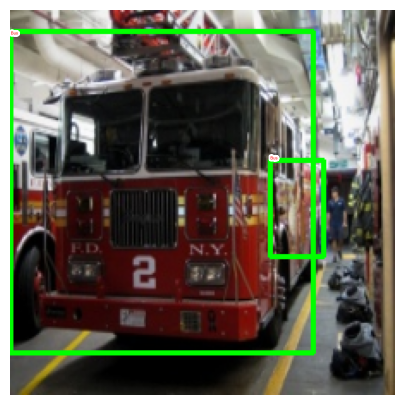

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


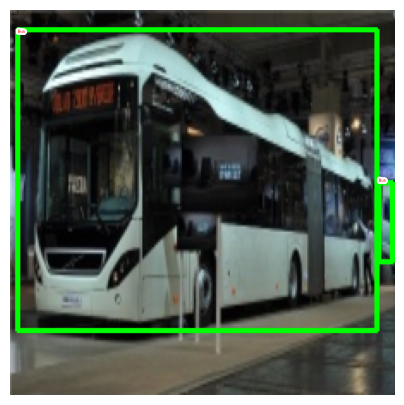

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


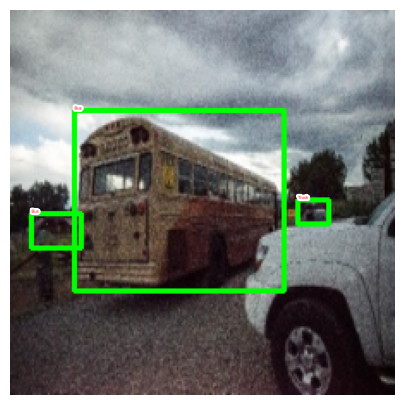

In [30]:
model.eval()
for ix, (images, targets) in enumerate(test_loader):
    if ix==3: break
    images = [im for im in images]
    outputs = model(images)
    for ix, output in enumerate(outputs):
        bbs, confs, labels = decode_output(output)
        info = [f'{l}@{c:.2f}' for l,c in zip(labels, confs)]
        show(images[ix].cpu().permute(1,2,0), bbs=bbs, texts=labels, sz=5)

# YOLO. Подход и архитектура. Логика работы. 

---

**Простыми словами**:

<br>
</br>

YOLO (You Only Look Once) - это алгоритм, предназначенный для целей детекции объектов, который как понятно из названия, анализирует изображение за один прогон, вместо того, чтобы многократно сканировать его различными фильтрами, ядрами или окнами. Это делает его очень быстрым, для целей использования в реальном времени. 

<br>
</br>

Логика работы YOLO состоит в том, что он делит изображение на сетку и каждая ячейка предсказывает несколько ограничительных рамок (bounding box'ов) для объектов на изображении, а также вероятности того, что в этих рамках находится объект. 

<br>
</br>

При использовании модели YOLO легко запутаться что и какюу версию модели использовать. Существует компания Ultralytics у которой есть целый фреймворк предназначенный для работы с архитектурой модели, плюс дополнительный функционал, предназначенный для работы с задачами сегментации, точечной детекции и тд. Фреймворк доступен по [ссылке](https://github.com/ultralytics/ultralytics) Кроме того доступна просто [огромнейшая документация](https://docs.ultralytics.com/) с примерами использования модели для каждого случая из жизни.

<br>
</br>

Под "капотом" YOLO работают различные архитектуры и вариации модели, которые включают:
1. _YOLOv1_: первая версия, которая ввела основную концепцию "смотрим один раз".
2. _YOLOv2 (YOLO9000)_: улучшенная версия, с более быстрыми и точными предсказаниями.
3. _YOLOv3:_ версия с тремя размерами якорных рамок для каждой ячейки сетки, позволяющая обнаруживать объекты разных размеров.
4. _YOLOv4:_ включает в себя множество оптимизаций и улучшений, делая его ещё быстрее и точнее.
5. _YOLOv5:_  включает в себя ряд улучшений и оптимизаций, в том числе упрощённую структуру и улучшенную производительность.
6. ..........
7. _YOLOv8:_ текущая и пока последняя версия алгоритма.

<br>
</br>

Установка:

```
pip install ultralytics
```

<br>
</br>

[Более полное объяснение.](https://blog.roboflow.com/whats-new-in-yolov8/)

![](./../src/imgs/yolov8.png)


<br>
</br>

**Техническая реализация и логика работы YOLO**:

<br>
</br>


Рассмотрим пример работы алгоритма на следующей картинке:

<br>
</br>

* У нас имеется следующее изображение с истинными объектами обведенными в красные баундинг боксы (ground truth bounding boxes):

![](./../src/imgs/yolo_example_1.png)

<br>
</br>

* Первым делом разделяем исходное изображение на **NxN** равных пропорциональных частей (квадратов/прямоугольников), допустим что **N=3** тогда мы получим следующую ситуацию:

![](./../src/imgs/yolo_example_2.png)

<br>
</br>

* Необходимо теперь определить те ячейки нашей сетки, в которых содержится центр хотя бы одной из границ ground truth bounding box'a. В нашем кейсе это ячейки **b1 и b3**
* В ячейку (ячейки) куда попадает центральная точка нашего баундинг бокса истинного объекта, отвечают за предсказание баундинг бокса объекта. Теперь необходимо создать истинные объекты соответствующие каждой ячейке.
* Выход истинных меток будет следующим: 

<br>
</br>

![](./../src/imgs/yolo_example_3.png)

- **pc** это objectiveness score то есть вероятность того, что наша ячейка содержит объект
- Как рассчитываются **bx, by, bw, bh**:
- Мы рассматриваем ячейку (допустим b1) как все пространство признаков и нормируем данные к шкале от 0 до 1, получаем на выходе следующую картину: 
 
<br>
</br>

![](./../src/imgs/yolo_example_4.png)

<br>
</br>

- **bx и by** это координаты центральной точки истинного баундинг бокса на нашей сетке в заданных координатах. В данном случае bx=0.5 и by=0.5 так как при нормированных координатах мы находимся на 0.5 "пикселей" от начала рамки.

![](./../src/imgs/yolo_example_5.png)

<br>
</br>

- Теперь задача вычислить **bh и bw**. _bw_ - это отношение ширины баундинг бокса к !ширине ячейки сетки! _bh_ - это отношение высоты баундинг бокса к !высоте ячейки сетки! Вот так все просто.
- Далее необходимо предсказать класс соответствующий ячейке сетки. Если у нас 3 класса, например c1, c2, c3, то мы будем предсказывать вероятность того, что ячейка содержит объект из любого из этих 3-х классов. Класс бэкграунда (фона) тут не нужен, так как pc соответствует тому, содержит ли ячейка сетки объект или нет.
- Теперь, выход ячейки а3 может быть следующим **у = [0, ?, ?, ?, ?, ..., ?]** так как pc = 0 алгоритм дальше не будет считать значения и затрачивать ресуры, так как объекта там все равно нет.
- Например выход ячейки b1 может быть следующим: **y = [1, 0.5, 0.5, 0.95, 0.8, 0, 1, 0]** последние элементы это вероятностное распределение классов (по сути 100% что класс 2 - например таже машина). Плюс мы имеем координаты и размеры баундинг бокса.

<br>
</br>

После того, как мы плюс минус поняли логику работы такого подхода, теперь нам необхимо определить модель, где в качестве входных данных будет изображение а в качестве выходных данных мы будем получать тензор размера 3х3х8 где истинных объект был по сути определен на предыдущем этапе. То есть:

![](./../src/imgs/yolo_example_6.png)

<br>
</br>

* Теперь необходимо определить истинный объект использзуя якорные точки. Для чего использовать еще и якорные точки - в реальности в нашей сетке очень часто может быть ситуация что в нашем поле находятся несколько объектов одновременно. Это приведен к росту false positives что повысит нам ошибку обнаружения и мы будем путаться. Например возьмем более сложное изображение: 

![](./../src/imgs/yolo_example_7.png)

<br>
</br>

Центр будет попадать в одну и туже ячейку b1. Одним из способов по логике вещей, избежать такой ситуации можно при помощи использования сеток с большим количеством разделений на части, например сетки размером 19х19 или 23х23 и так далее. Но это также может привести к ситуации, когда увеличивая число ячеек не помогает а наоборот ухудшает работу алгоритма. То есть тут надо эксперементировать. 

![](./../src/imgs/yolo_example_8.png)

<br>
</br>

Таким образом выход из первой части алгоритма может иметь следующий вид:

![](./../src/imgs/yolo_example_9.png)

<br>
</br>

Размерность будет **3х3х16** так как у нас уже 2 якорных бокса. Логика получения разменостей **NxNx(num_classes + 1) x (num_anchor_boxes)**


<br>
</br>

* Теперь необходимо определить функции потерь, которые мы будем оптимизировать

При вычислении функций потерь, которые мы будем использовать в модели, необходимо убедиться в том, что мы не будем вычислять потери при регрессии и классификации, когда оценка объектиности (объективности, pc) меньше определенного порога (ячейки в которых отсутствует потенциальный объект). Кроме того, если ячейка содержит объект, необходимо обеспечить максимально точную классификацю по различным классам. И если ячейка содержит объект, то смещения координат баундинг бокса должны быть как можно ближе к ожидаемым (то есть как можно плотно описывать найденный объект). Но смещения по ширине и высоте могут быть гораздо больше, чем смещения от центра (так как смещение центра лежит в диапазоне от 0 до 1, а по высоте и ширине нет). Таким образом мы придаем меньший вес смещениям по ширине и высоте, извлекая просто квадратный корень из смещения, то есть функции потерь будут иметь следующий вид:

<br>
</br>




### $L_{loc} = \lambda_{coord} \sum_{i=0}^{S^2} \sum_{j=0}^{B} 1_{ij}^{obj} [(x_i - \hat{x_i})^2 + (y_i - \hat{y_i})^2 + (\sqrt{w_i} - \sqrt{\hat{w_i}})^2 + (\sqrt{h_i} - \sqrt{\hat{h_i}})^2]$

<br>
</br>

### $L_{cls} = \sum_{i=0}^{S^2} \sum_{j=0}^{B}(1_{ij}^{obj} + \lambda_{noobj} (1 - 1_{ij}^{obj})) (C_{ij} - \hat_{C_{ij}})^2 +  \sum_{i=0}^{S^2}  \sum_{c \in C}^{} 1_{ij}^{obj} (p_i (c) - \hat_{p_i (c))^2} $

<br>
</br>

### $L_{tot} = L_{loc} + L_{cls}$

<br>
</br>

* ### $\lambda_{coord}$ весовой коэффициент для функции потерь регрессии
* ### $1_{ij}^{obj}$ представляет с собой бинарную оценку присутствия или отсутствия объекта в ячейке
* ### $\hat_{p_i}(c)$ отражает предсказанную вероятность класса и $C_{ij}$ это objectiveness score


[Раньше до отделения команды решение принадлежало данному разработчику, точнее разработчикам](https://github.com/AlexeyAB/darknet)

In [2]:
from ultralytics import YOLO

# Load a model
model = YOLO('yolov8n.yaml')  # build a new model from YAML
model = YOLO('yolov8n.pt')  # load a pretrained model (recommended for training)
model = YOLO('yolov8n.yaml').load('yolov8n.pt')  # build from YAML and transfer weights

# Train the model
results = model.train(data='coco128.yaml', epochs=10, imgsz=640)


                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128

  8                  -1  1    460288  ultralytics.nn.modules.block.C2f             [256, 256, 1, True]           
  9                  -1  1    164608  ultralytics.nn.modules.block.SPPF            [256, 256, 5]                 
 10                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          
 11             [-1, 6]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 12                  -1  1    148224  ultralytics.nn.modules.block.C2f             [384, 128, 1]                 
 13                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          
 14             [-1, 4]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 15                  -1  1     37248  ultralytics.nn.modules.block.C2f             [192, 64, 1]                  
 16                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 

              airplane        128          6      0.805          1      0.972       0.84
                   bus        128          7      0.828      0.714      0.698      0.627
                 train        128          3       0.69          1      0.913      0.913
                 truck        128         12      0.948        0.5      0.537      0.358
                  boat        128          6      0.672      0.333      0.563      0.394
         traffic light        128         14      0.514      0.143      0.194      0.138
             stop sign        128          2      0.732          1      0.995      0.652
                 bench        128          9      0.775      0.389      0.709      0.468
                  bird        128         16      0.933      0.875      0.933       0.65
                   cat        128          4      0.856          1      0.995      0.778
                   dog        128          9      0.665      0.889      0.908      0.728
                 hors

In [3]:

model = YOLO('./yolov8n.pt')  # load a custom model

# Validate the model
metrics = model.val()  # no arguments needed, dataset and settings remembered
metrics.box.map    # map50-95
metrics.box.map50  # map50
metrics.box.map75  # map75
metrics.box.maps   # a list contains map50-95 of each category

Ultralytics YOLOv8.0.182  Python-3.11.2 torch-2.0.1+cu118 CUDA:0 (NVIDIA GeForce RTX 2080 Ti, 11264MiB)
YOLOv8n summary (fused): 168 layers, 3151904 parameters, 0 gradients
val: Scanning D:\hw\module_8\objectDetection\datasets\coco\labels\val2017... 4952 images, 48 backgrounds, 0 corrupt: 100%|██████████| 5000/5000 [00:03<00:00, 1343.94it/s]
val: New cache created: D:\hw\module_8\objectDetection\datasets\coco\labels\val2017.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 313/313 [00:45<00:00,  6.84it/s]
                   all       5000      36335      0.633      0.475      0.521      0.371
                person       5000      10777      0.754      0.673      0.745      0.514
               bicycle       5000        314      0.687      0.392      0.457      0.265
                   car       5000       1918      0.646      0.515      0.561      0.364
            motorcycle       5000        367       0.71       0.58    

loading annotations into memory...
Done (t=0.49s)
creating index...
index created!
Loading and preparing results...
DONE (t=2.09s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=46.92s).
Accumulating evaluation results...
DONE (t=10.08s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.373
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.525
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.405
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.185
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.410
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.535
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.320
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.532
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDe

Results saved to runs\detect\val2


array([    0.51421,     0.26457,     0.36372,     0.41344,     0.65279,      0.6196,     0.64555,     0.29333,     0.21019,      0.2112,     0.60869,      0.6301,     0.44096,     0.19322,     0.27776,     0.65162,     0.59116,     0.52489,     0.45955,     0.48695,     0.62938,     0.68889,      0.6582,     0.68283,
           0.10024,     0.35935,     0.08484,     0.26836,      0.3418,     0.58406,     0.18803,     0.26635,     0.32851,      0.3801,     0.21597,     0.30199,     0.45133,      0.3088,     0.39721,     0.29769,     0.26989,     0.35043,     0.26322,     0.10604,    0.098812,     0.39043,     0.23335,     0.15601,
            0.3489,     0.28055,     0.20949,     0.18914,     0.36416,     0.50267,     0.40763,     0.29236,      0.2571,     0.43414,     0.22544,     0.42703,     0.29308,     0.64207,     0.55254,     0.57992,     0.52666,     0.16018,     0.48198,     0.27994,     0.51418,     0.34907,     0.31403,     0.33699,
           0.51091,     0.09692,      0.456

In [5]:
# Predict with the model
results = model('https://ultralytics.com/images/bus.jpg')  # predict on an image


Found https://ultralytics.com/images/bus.jpg locally at bus.jpg
image 1/1 D:\hw\module_8\objectDetection\bus.jpg: 640x480 4 persons, 1 bus, 1 stop sign, 113.0ms
Speed: 7.0ms preprocess, 113.0ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 480)
